In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


# Configuration
target = 'squiggly'  # Choose from 'guassian', 'ring', 'banana', 'squiggly', 'checkerboard', 'spirals'
device = torch.device("mps" if torch.backends.mps.is_available() 
                      else "cuda" if torch.cuda.is_available() 
                      else "cpu")
print(device)

# Define the target distribution and its gradient
if target == 'spirals':
    def target_distribution(pos):
        x = pos.reshape(-1, 2)
        theta = torch.atan2(x[:, 1], x[:, 0]) + 2 * torch.pi
        r = torch.sqrt(x[:, 0]**2 + x[:, 1]**2)
        density = torch.exp(-4 * 0.5 * ((r - (theta / (2 * torch.pi) * 4)) ** 2))  # Decreased radius
        return density.reshape(pos.shape[:-1])

    def grad_log_p(x):
        theta = torch.atan2(x[:, 1], x[:, 0]) + 2 * torch.pi
        r = torch.sqrt(x[:, 0]**2 + x[:, 1]**2)
        print((r - (theta / (2 * torch.pi) * 4)).shape)
        grad_r = (r - (theta / (2 * torch.pi) * 4)) * x / r.unsqueeze(1)  # Decreased radius
        grad_theta = (r - (theta / (2 * torch.pi) * 4)) * torch.stack([-x[:, 1], x[:, 0]], dim=-1) / (r.unsqueeze(1)**2)
        return -4 * (grad_r + grad_theta)
    
elif target == 'squiggly':
    # Define the target distribution: Squiggly distribution
    def target_distribution(x):
        x1, x2 = x[:,:, 0], x[:,:, 1]
        return torch.exp(-0.25 * ((x2 - torch.sin(3 * x1)) ** 2 / 0.1))

    def grad_log_p(x):
        if x.ndim == 1:
            x = x.reshape(1, -1)
        x1, x2 = x[:, 0], x[:, 1]
        grad_x1 = -3 * torch.cos(3 * x1) * (x2 - torch.sin(3 * x1)) / 0.1
        grad_x2 = -(x2 - torch.sin(3 * x1)) / 0.1
        return  0.5 * torch.column_stack((grad_x1, grad_x2))
elif target == 'banana':
    # Banana distribution
    def target_distribution(x):

        x1, x2 = x[..., 0], x[..., 1]
        return torch.exp(-2.0 * ((x1**2 / 100) + (x2 + 0.03 * x1**2 - 3) ** 2))

    def grad_log_p(x):

        x1, x2 = x[..., 0], x[..., 1]
        grad_x1 = -x1 / 50 - 0.06 * x1 * (x2 + 0.03 * x1**2 - 3)
        grad_x2 = -(x2 + 0.03 * x1**2 - 3)
        return torch.stack((grad_x1, grad_x2), dim=-1)
elif target == 'ring':
    def target_distribution(x):
        radius = 4
        norm_x = torch.norm(x, dim=-1)
        return torch.exp(-2.0 * (norm_x - radius) ** 2)
    def grad_log_p(x):
        radius = 4
        norm_x = torch.norm(x, dim=-1, keepdim=True)
        return -4.0 * (norm_x - radius) * x / norm_x
    
elif target == 'gaussian':
    def target_distribution(x):
        if x.device.type == 'mps':
            x = x.cpu()
        
        mean1, cov1 = torch.tensor([2.0, 2.0]), torch.tensor([[0.5, 0.1], [0.1, 0.5]])
        mean2, cov2 = torch.tensor([-2.0, -2.0]), torch.tensor([[0.5, -0.1], [-0.1, 0.5]])
        pdf1 = torch.exp(-0.5 * torch.sum((x - mean1) @ torch.linalg.inv(cov1) * (x - mean1), dim=-1)) / torch.sqrt(torch.det(cov1) * (2 * torch.pi) ** 2)
        pdf2 = torch.exp(-0.5 * torch.sum((x - mean2) @ torch.linalg.inv(cov2) * (x - mean2), dim=-1)) / torch.sqrt(torch.det(cov2) * (2 * torch.pi) ** 2)
        pdf1 = pdf1.to(device)
        pdf2 = pdf2.to(device)
        return 0.5 * pdf1 + 0.5 * pdf2

    def grad_log_p(x):
        if x.device.type == 'mps':
            x = x.cpu()
        
        mean1, cov1 = torch.tensor([2.0, 2.0]), torch.tensor([[0.5, 0.1], [0.1, 0.5]])
        mean2, cov2 = torch.tensor([-2.0, -2.0]), torch.tensor([[0.5, -0.1], [-0.1, 0.5]])
        pdf1 = torch.exp(-0.5 * torch.sum((x - mean1) @ torch.linalg.inv(cov1) * (x - mean1), dim=-1)) / torch.sqrt(torch.det(cov1) * (2 * torch.pi) ** 2)
        pdf2 = torch.exp(-0.5 * torch.sum((x - mean2) @ torch.linalg.inv(cov2) * (x - mean2), dim=-1)) / torch.sqrt(torch.det(cov2) * (2 * torch.pi) ** 2)
        grad1 = -(x - mean1) @ torch.linalg.inv(cov1).T
        grad2 = -(x - mean2) @ torch.linalg.inv(cov2).T
        d_log_p = 0.5 * (grad1 * pdf1[:, None] + grad2 * pdf2[:, None]) / (pdf1 + pdf2).unsqueeze(-1)
        d_log_p = d_log_p.to(device)
        return d_log_p
elif target == 'checkerboard':
    def target_distribution(x):
        device = x.device
        x1, x2 = x[:,:, 0], x[:,:, 1]
        
        scale = 3.0  # Adjust this scale to control the size of the squares
    
        checkered = ((torch.floor(x1 / scale) + torch.floor(x2 / scale)) % 2 == 0).float()
        return checkered        

    def grad_log_p(x):
        # Gradient is zero everywhere for a checkerboard pattern as it is piecewise constant
        return torch.zeros_like(x)


 
else:
    raise ValueError("Invalid target distribution")



def make_plot(iteration, fast_steps, particles, updates, kernel_matrix, bandwidth):

    print(f'Iteration {iteration}, Fast steps: {fast_steps}, Bandwidth: {bandwidth}')
    plt.figure(figsize=(4, 4))
    # plt.imshow(kernel_matrix.cpu().numpy())
    # plt.colorbar()
    # plt.title('Kernel Matrix')

    x, y = torch.meshgrid(torch.linspace(-5, 5, 100), torch.linspace(-5, 5, 100))
    pos = torch.stack((x, y), dim=-1).to(particles.device)
    targets = target_distribution(pos).cpu().numpy()
    plt.contour(x.cpu(), y.cpu(), targets, levels=5, cmap='Pastel1', alpha=0.6)
    plt.colorbar(label='Target Density')

    # Scatter plot of particles
    plt.scatter(particles[:, 0].cpu(), particles[:, 1].cpu(), color='red', s=10, label='Particles')

    arrow_scale = 2
    magnitudes = torch.norm(updates, dim=1)  
    max_magnitude = magnitudes.max().item()

    # Scale gradients so the largest has unit length
    updates = updates / (max_magnitude + 1e-8) * arrow_scale


    # Add arrows for particle movement
    for i, (particle, update) in enumerate(zip(particles, updates)):
        plt.arrow(
            particle[0].cpu().item(),
            particle[1].cpu().item(),
            update[0].cpu().item(),
            update[1].cpu().item(),
            color='blue',
            width=0.01,
            head_width=0.05,
            head_length=0.1,
            length_includes_head=True,
            alpha=0.8,
        )
    
    # Plot settings
    plt.title(f'Particle Movements at Iteration {iteration}')
    plt.xlim(-5, 5)
    plt.ylim(-5, 5)
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')
    plt.legend()
    plt.grid(False)
    plt.show()




# # SVGD Update with Metropolis-Hastings and iteration-dependent acceptance probability
def svgd_update_with_kernel_smoothing(particles, grad_log_p, target_distribution, iteration, max_iterations,
                  fast_steps_initial=5, fast_steps_final=1, dt_fast=0.1, bandwidth=5):
    
    # Adaptive fast_steps based on iteration number
    fast_steps = int(fast_steps_initial - (fast_steps_initial - fast_steps_final) * (iteration / max_iterations))
    fast_steps = max(fast_steps, fast_steps_final)  # Ensure it doesn't go below the minimum
    bandwidth = bandwidth/np.sqrt(iteration+1)  # Decrease bandwidth over time

    # Compute step size based on dt_fast and fast_steps
    step_size = dt_fast * fast_steps

    # Compute the kernel matrix for SVGD
    distances = torch.cdist(particles, particles) ** 2
    kernel_matrix = torch.exp(-distances / (2 * bandwidth**2))

        
    # Define functions for fast and slow dynamics
    def f_fast(t, particles):
        kernel_grad = -(particles.unsqueeze(1) - particles.unsqueeze(0)) * kernel_matrix.unsqueeze(-1) / (bandwidth**2)
        return kernel_grad.sum(dim=0) / len(particles)

    def f_slow(t, particles):
        # Compute SVGD direction
        grad_log_p_values = grad_log_p(particles)
        svgd_direction_slow = kernel_matrix @ grad_log_p_values / len(particles)

        # # Kernel-smoothed target distribution gradient
        # weights = target_distribution(particles.unsqueeze(0)).squeeze().unsqueeze(1)
        # kernel_grad = -(particles.unsqueeze(1) - particles.unsqueeze(0)) * kernel_matrix.unsqueeze(-1) / ((2*bandwidth)**2)
        # grad_p_smooth = (kernel_grad * weights.unsqueeze(-1)).sum(dim=0) / len(particles)

        # Combine SVGD direction with kernel-smoothed gradient
        return svgd_direction_slow 

    # Fast-step updates
    t_fast = 0
    y_fast = particles.clone()

    for _ in range(fast_steps):
        y_fast += dt_fast * f_fast(t_fast, y_fast)
        t_fast += dt_fast

    # Slow-step update
    y_slow = y_fast + step_size * f_slow(t_fast, y_fast)

    # # Metropolis-Hastings acceptance step with iteration-dependent probability
    # current_density = target_distribution(particles.unsqueeze(0)).squeeze()
    # proposed_density = target_distribution(y_slow.unsqueeze(0)).squeeze()
    # temperature = 1.0 - (iteration / max_iterations)  # Decreasing temperature
    # acceptance_ratio = (proposed_density / current_density).clamp(max=1.0) ** temperature
    # accept = torch.rand_like(acceptance_ratio) < acceptance_ratio
    # particles = torch.where(accept.unsqueeze(-1), y_slow, particles)

    # if iteration % 20 == 0:
    #     make_plot(iteration, fast_steps, particles, y_slow-particles, kernel_matrix, bandwidth)

    return y_slow




# Visualization function
def plot_particles(particles, target_distribution, iteration):
    plt.figure(figsize=(8, 6))
    x, y = torch.meshgrid(torch.linspace(-5, 5, 100), torch.linspace(-5, 5, 100))
    pos = torch.stack((x, y), dim=-1).to(device)
    targets = target_distribution(pos).cpu().numpy()

    plt.contourf(x.cpu(), y.cpu(), targets, levels=30, cmap='viridis', alpha=0.6)
    plt.scatter(particles[:, 0].cpu(), particles[:, 1].cpu(), color='red', s=10)
    plt.title(f'Iteration {iteration}')
    plt.xlim(-5, 5)
    plt.ylim(-5, 5)
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.show()



# # Run SVGD
# num_iterations = 10
# for i in range(num_iterations):
#     particles = svgd_update(particles, grad_log_p, kernel_bandwidth=0.5, step_size=0.5, fast_steps=4)
#     if i % 2 == 0:
#         plot_particles(particles, target_distribution, i)


mps


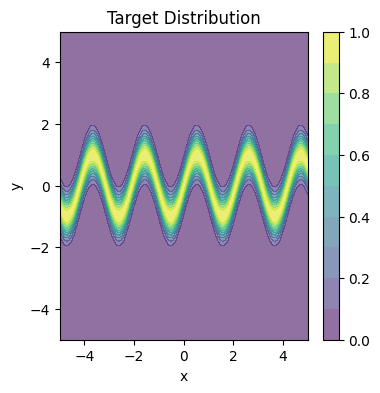

In [132]:
import torch
import matplotlib.pyplot as plt

# Define the grid for visualization
grid_size = 0.01
x = torch.arange(-5, 5, grid_size)
y = torch.arange(-5, 5, grid_size)
x, y = torch.meshgrid(x, y, indexing='ij')  # Create a mesh grid
pos = torch.stack((x, y), dim=-1)  # Combine x and y into a single tensor of shape (500, 500, 2)

# Evaluate the target distribution on the grid
dist = target_distribution(pos)  # Using the PyTorch-based target_distribution
dist = dist.reshape(x.shape)  # Reshape to match the grid for plotting

# Plot using Matplotlib
fig, ax = plt.subplots(figsize=(4, 4))
contour = ax.contourf(x.numpy(), y.numpy(), dist.numpy(), levels=10, cmap='viridis', alpha=0.6)
plt.colorbar(contour)
plt.title("Target Distribution")
plt.xlabel("x")
plt.ylabel("y")
plt.show()


In [133]:

# Initialize particles
num_particles = 100
particles = (torch.rand(num_particles, 2) - 0.5) * 10
particles = particles.to(device)
num_iterations = 500

# Parameters
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
all_particles = [particles.clone()]  # Store particles for each iteration

# Run SVGD iterations
for iteration in range(num_iterations):
    particles = svgd_update_with_kernel_smoothing(particles, grad_log_p, target_distribution, iteration,
                            num_iterations)  # Use PyTorch-based SVGD update
    all_particles.append(particles.clone())  # Store the updated particles
    plt.show()

# Convert particles to a single stacked tensor for easier handling
all_particles = torch.stack(all_particles, dim=0)  # Shape: (num_iterations, num_particles, 2)

# Create animation
fig, ax = plt.subplots(figsize=(4, 4))

# Define the grid for the target distribution plot
grid_size = 0.01
x = torch.arange(-5, 5, grid_size, device=device)
y = torch.arange(-5, 5, grid_size, device=device)
x, y = torch.meshgrid(x, y, indexing="ij")
pos = torch.stack((x, y), dim=-1)
dist = target_distribution(pos).cpu()  # Evaluate the target distribution on the grid

# Convert to NumPy for Matplotlib plotting
x_np, y_np = x.cpu().numpy(), y.cpu().numpy()
dist_np = dist.numpy()

# Plot the target distribution
contour = ax.contourf(x_np, y_np, dist_np, levels=10, cmap="viridis", alpha=0.6)

# Initialize the scatter plot for particles
scatter = ax.scatter([], [], color="red", s=10)

# Update function for animation
def update(frame):
    scatter.set_offsets(all_particles[frame].cpu().numpy())  # Update particle positions
    ax.set_title(f"Iteration {frame}")
    return scatter,

# Create the animation
ani = FuncAnimation(fig, update, frames=num_iterations, blit=True)

# Display the animation
plt.close(fig)  # Close the static plot
HTML(ani.to_jshtml())


In [ ]:
ani.save('svgd.gif',  fps=60)

In [ ]:
def kl_divergence(particles, target_distribution, bandwidth=0.5):
    """
    Estimate the KL divergence between particle distribution and the target distribution.
    
    Args:
        particles (torch.Tensor): Particle positions of shape (N, D).
        target_distribution (callable): Function to evaluate target distribution probability.
        bandwidth (float): Bandwidth for kernel density estimation of particles.

    Returns:
        float: Estimated KL divergence.
    """
    device = particles.device
    N, D = particles.shape

    # Estimate particle density with RBF kernel density estimation
    distances = torch.cdist(particles, particles) ** 2
    kernel_matrix = torch.exp(-distances / (2 * bandwidth**2))
    particle_density = kernel_matrix.sum(dim=1) / (N * (2 * torch.pi * bandwidth**2) ** (D / 2))

    # Evaluate target distribution
    target_density = target_distribution(particles.unsqueeze(0)).squeeze().clamp(min=1e-12)  # Avoid log(0)

    # Estimate KL divergence
    kl = torch.mean(torch.log(particle_density) - torch.log(target_density))
    return kl.item()

def mmd(particles, target_samples, bandwidth=0.5):
    """
    Compute the Maximum Mean Discrepancy (MMD) between particles and samples from the target distribution.

    Args:
        particles (torch.Tensor): Particle positions of shape (N, D).
        target_samples (torch.Tensor): Samples from the target distribution of shape (M, D).
        bandwidth (float): Bandwidth for the RBF kernel.

    Returns:
        float: MMD^2 value.
    """
    device = particles.device
    N, D = particles.shape
    M = target_samples.shape[0]

    # RBF kernel
    def rbf_kernel(x, y, gamma):
        return torch.exp(-gamma * torch.cdist(x, y) ** 2)

    # Kernel terms
    gamma = 1 / (2 * bandwidth**2)
    k_xx = rbf_kernel(particles, particles, gamma).mean()
    k_yy = rbf_kernel(target_samples, target_samples, gamma).mean()
    k_xy = rbf_kernel(particles, target_samples, gamma).mean()

    mmd2 = k_xx - 2 * k_xy + k_yy
    return mmd2.item()

kl = kl_divergence(particles, target_distribution)
print(f"KL Divergence: {kl}")

# target_samples = torch.randn(1000, 2)  # Replace with actual target samples
# mmd_value = mmd(particles, target_samples)
# print(f"MMD^2: {mmd_value}")


In [ ]:
plt.rcParams.update({
    'figure.dpi': 100,
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.figsize': (6, 4),
    'lines.linewidth': 1.5,
    'grid.linestyle': '--',
    'grid.alpha': 0.7
})

# Plot with professional settings
# Choose a clean style